In [99]:
import os
import pickle
import sys
_path = os.path.abspath('../')
if _path not in sys.path:
    sys.path.append(_path)

import astropy.coordinates as coord
import astropy.table as at
from astropy.io import fits
import astropy.units as u
import gala.coordinates as gc

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import healpy as hp
from tqdm import tqdm, trange
func = lambda x, y, z: hp.vec2pix(nside, x, y, z)

from stream_helpers import rots, get_data, apwnorm, get_rot, zyx_euler_from_endpoints

In [3]:
rots['orp'] = get_rot(gc.Orphan())

### Load cubes:

In [4]:
cube, distmods, footprint = get_data(
    '../data/BASS_iso_hpxcube_z0.0001_a13.5_gmax23.fits.gz', 
    '../data/DECaLS_iso_hpxcube_z0.0001_a13.5_gmax23.fits.gz', 
    stitch=True)

npix, nslice = cube.shape
nside = hp.npix2nside(npix)

In [5]:
pix_idx = np.arange(hp.nside2npix(nside), dtype=int)
pix_c = hp.pix2ang(nside, pix_idx, 
                   lonlat=True)
pix_c = coord.SkyCoord(pix_c[0]*u.deg, pix_c[1]*u.deg)

In [6]:
pix_gal = pix_c.transform_to(coord.Galactic)
pix_l = pix_gal.l
pix_b = pix_gal.b

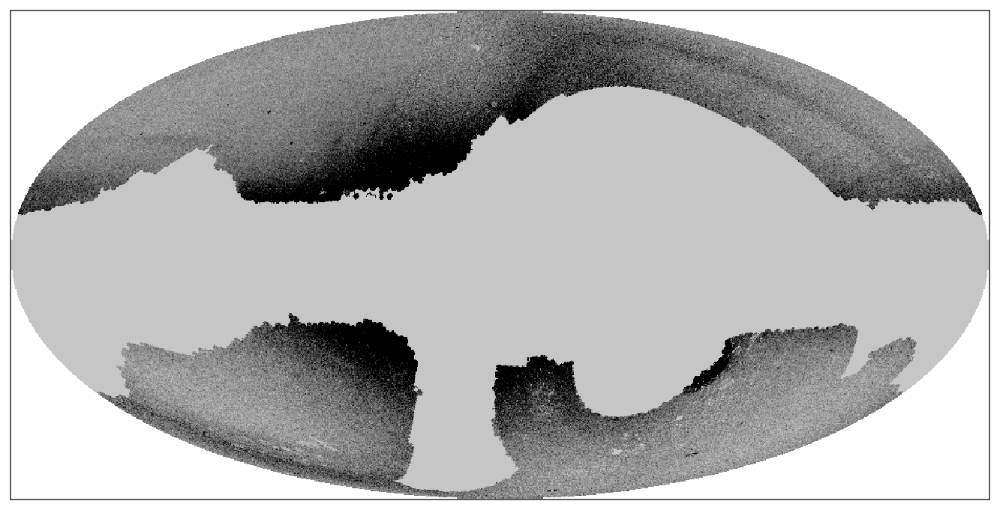

In [7]:
# check stitching:
proj = hp.projector.MollweideProj(xsize=1024, 
                                  rot=[266.4, -28.9, 59.])
img = proj.projmap(np.sum(cube[:, :40], axis=1)/40, func)

fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.imshow(img, origin='bottom', extent=proj.get_extent(), 
          vmin=-5, vmax=1e1, cmap='Greys')
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

In [8]:
def get_vscale(img, q=[5, 95]):
    from astropy.stats import sigma_clip
    
    _tmp = img.ravel()
    stdfunc = lambda x,axis: 1.5*np.median(np.abs(x-np.median(x,axis=axis)), axis=axis)
    _tmp_clipped = sigma_clip(_tmp[_tmp != 0], stdfunc=stdfunc)
    
    return np.percentile(_tmp_clipped[_tmp_clipped > 0], q)

---

### Known globs and blobs

In [10]:
all_blobs = at.Table.read('/Users/apricewhelan/data/Misc/MW_dwarfs_globs.fits')
all_blobs = all_blobs[all_blobs['DM'] < 25]
all_blobs_c = coord.SkyCoord(all_blobs['ra']*u.deg,
                             all_blobs['dec']*u.deg,
                             coord.Distance(distmod=all_blobs['DM']))

# Special case some half-light radii:
all_blobs['r_h'][all_blobs['name'] == 'SagittariusdSph'] = 2.5 * 60
all_blobs['r_h'][all_blobs['name'] == '#Andromeda'] = 1.5 * 60
all_blobs['r_h'][all_blobs['name'] == 'BootesIII'] = 10
all_blobs['r_h'][all_blobs['name'] == 'LMC'] = 5*60
all_blobs['r_h'][all_blobs['name'] == 'SMC'] = 2.5*60
all_blobs['r_h'][all_blobs['name'] == 'Triangulum'] = 60
all_blobs['r_h'][all_blobs['name'] == 'NGC5904 (M 5)'] /= 2

blobs = at.Table.read('/Users/apricewhelan/data/Misc/Vasiliev-globclust.txt',
                      format='ascii.basic')
blobs.rename_column('Name', 'name')
blobs_c = coord.SkyCoord(blobs['RA']*u.deg,
                         blobs['DEC']*u.deg,
                         blobs['D']*u.kpc)

In [11]:
in_footprint_idx = []
for i, cl_c in enumerate(blobs_c):
    pix = hp.ang2pix(nside, cl_c.ra.degree, cl_c.dec.degree, 
                     lonlat=True)
    
    if footprint[pix]:
        in_footprint_idx.append(True)
    else:
        in_footprint_idx.append(False)
        
in_footprint_idx = np.array(in_footprint_idx)

In [12]:
len(blobs[in_footprint_idx])

25

In [13]:
blobs[in_footprint_idx]

col0,name,RA,DEC,D,Vlos,eVlos,PMRA,PMDEC,ePMRA,ePMDEC,corrPM,radius,Nmember,col14
int64,str21,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64
--,NGC 288,13.188,-26.583,8.9,-44.8,0.1,4.243,-5.642,0.005,0.004,0.198,8.0,6166,--
--,Whiting 1,30.738,-3.253,30.1,-130.6,1.8,-0.197,-1.756,0.088,0.064,-0.073,3.0,39,--
--,E 1 (AM 1),58.76,-49.615,123.3,116.0,20.0,0.337,-0.385,0.122,0.168,-0.13,2.5,37,--
--,Eridanus,66.185,-21.187,90.1,-23.6,2.1,0.491,-0.372,0.05,0.056,-0.317,4.0,31,--
--,NGC 1851,78.528,-40.047,12.1,320.2,0.2,2.138,-0.628,0.007,0.007,-0.101,10.0,4639,--
--,NGC 1904 (M 79),81.046,-24.525,12.9,205.6,0.2,2.475,-1.574,0.006,0.007,-0.033,8.0,2747,--
--,NGC 2419,114.535,38.882,82.6,-20.6,0.2,-0.027,-0.534,0.017,0.011,0.108,5.0,826,--
--,Pal 3,151.383,0.072,92.5,89.9,1.2,0.087,-0.085,0.133,0.157,-0.51,3.0,36,--
--,Pal 4,172.32,28.974,108.7,72.7,0.3,-0.145,-0.516,0.085,0.168,-0.646,4.0,30,--


### Come up with a mask for bright galaxies and globular clusters

In [14]:
this_blob_mask = np.ones(hp.nside2npix(nside))
for row, cc in zip(all_blobs, all_blobs_c):        
    size = (cc.distance * row['r_h']*u.arcmin).to_value(u.kpc, u.dimensionless_angles())
    rep = coord.CartesianRepresentation(np.random.normal(cc.cartesian.xyz.to_value(u.kpc), 
                                                         2 * size, 
                                                         (65536, 3)).T * u.kpc)
    spray = coord.SkyCoord(rep)
    this_blob_mask[hp.ang2pix(nside, spray.ra.degree, spray.dec.degree, lonlat=True)] = 0.
    
# Also mask out Sag:
# mask_c = gc.Sagittarius(np.random.uniform(0, 360, 4*65536)*u.deg,
#                         np.random.normal(0, 10, 4*65536)*u.deg).transform_to(coord.ICRS)
# this_blob_mask[hp.ang2pix(nside, mask_c.ra.degree, mask_c.dec.degree, lonlat=True)] = 0.
    
this_blob_mask = hp.smoothing(this_blob_mask, sigma=np.radians(0.2))
_derp = this_blob_mask > 0.8
this_blob_mask[_derp] = 1
this_blob_mask[~_derp] = 0
blob_mask = np.array(1 - this_blob_mask, dtype=bool)

full_stack = np.sum(cube, axis=1) / nslice
full_stack_masked = full_stack * this_blob_mask
full_stack_masked[full_stack_masked > 1e3] = 0.

Sigma is 12.000000 arcmin (0.003491 rad) 
-> fwhm is 28.257841 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


### huh

In [15]:
# Xnoblob = np.percentile(cube, 15, axis=1).copy()
# Xnoblob[blob_mask] = 0.
# Xnoblob = hp.smoothing(Xnoblob, sigma=np.radians(5))
# img = projs['icrs'].projmap(Xnoblob, func) 

# fig, ax = plt.subplots(1, 1, figsize=(16, 16))
# ax.imshow(img, origin='bottom', extent=proj.get_extent(), 
#           cmap='Greys', vmax=1e1)
# ax.xaxis.set_visible(False)
# ax.yaxis.set_visible(False)

### Images in different projections

In [114]:
slices = [(26, 55),
          (15, 26),
          (5, 15)]
# slices = [(20, 30),
#           (8, 20),
#           (0, 8)]

slice_str = '_'.join(['{}-{}'.format(x,y) for x,y in slices])
dist = coord.Distance(distmod=distmods)

for x, y in slices:
    print(dist[x], dist[y])

20.892961308540322 kpc 79.43282347242742 kpc
12.589254117941637 kpc 20.892961308540322 kpc
7.943282347242814 kpc 12.589254117941637 kpc


In [115]:
stacks = np.stack([np.sum(cube[:, x:y], axis=1) / (y - x) 
                   for x, y in slices], 
                  axis=-1)

rgb = np.zeros_like(stacks)
for i in range(3):
    X = stacks[..., i]

    # No bg subtrack:
    rgb[..., i] = hp.smoothing(X, sigma=np.radians(0.15), verbose=False)
    
    # Subtract smoothed
    # Xnoblob = X.copy()
    # Xnoblob[blob_mask] = 0.
    # rgb[..., i] = (hp.smoothing(X, sigma=np.radians(0.15)) - 
    #                hp.smoothing(Xnoblob, sigma=np.radians(7.5)))
    
    # Subtract crazy-ass background model from above
    # rgb[..., i] = X - bg_model
    # rgb[..., i] = X - get_bg(X)
    # rgb[..., i] = hp.smoothing(rgb[..., i], sigma=np.radians(0.2))
    
    rgb[X==0, i] = 0.

for i in range(3):
    X = stacks[..., i]
    
    rgb[..., i] = apwnorm(rgb[..., i], 
                          min=np.percentile(rgb[footprint, i], 2.5), #2.5), 
                          max=np.percentile(rgb[footprint, i], 90))
    # a = 1e-1
    # rgb[..., i] = np.arcsinh(rgb[..., i]/a) / np.arcsinh(1/a)
    
    rgb[X==0, i] = 0.

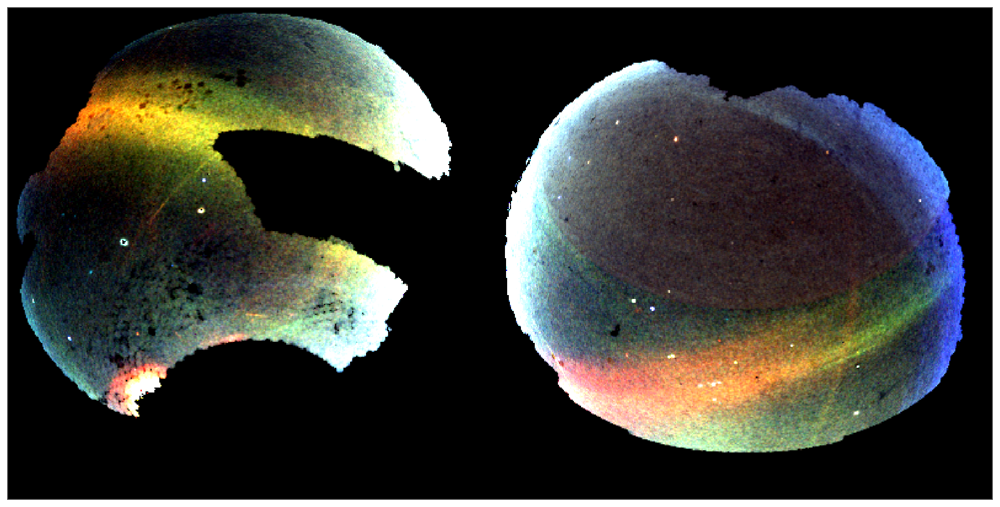

In [38]:
proj = hp.projector.OrthographicProj(rot=[0, -45, 0])
img = np.stack([proj.projmap(rgb[:, i], func) 
                for i in range(3)], axis=-1)
fig, ax = plt.subplots(1, 1, figsize=(16, 16))
ax.imshow(img, origin='bottom', extent=proj.get_extent())
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

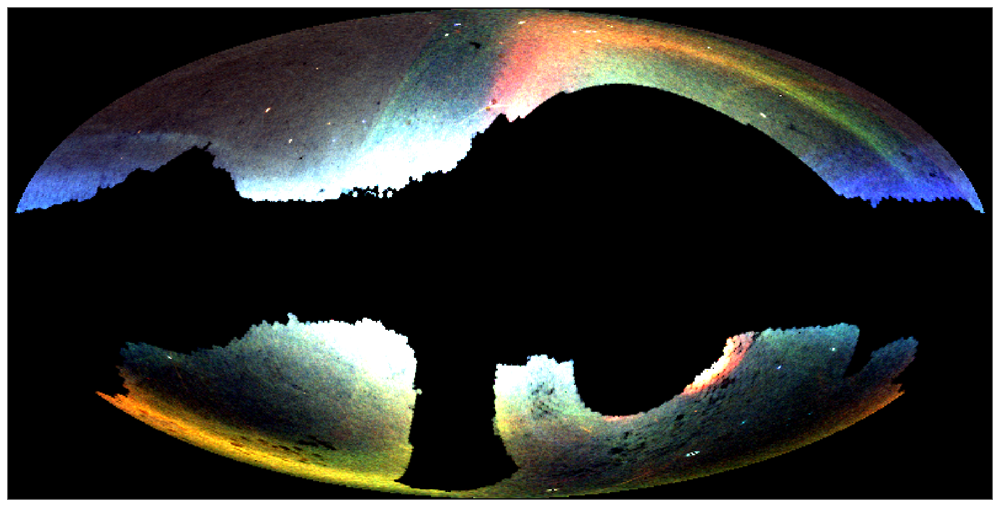

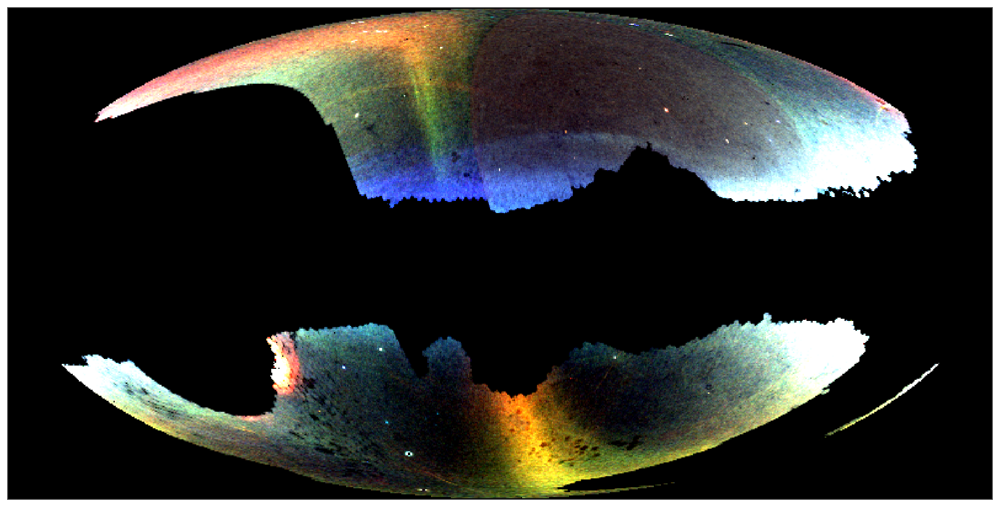

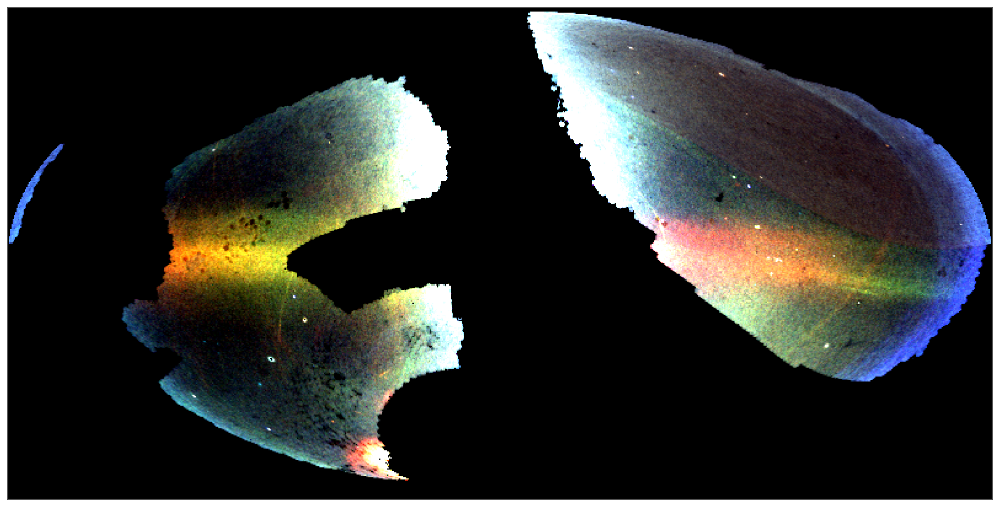

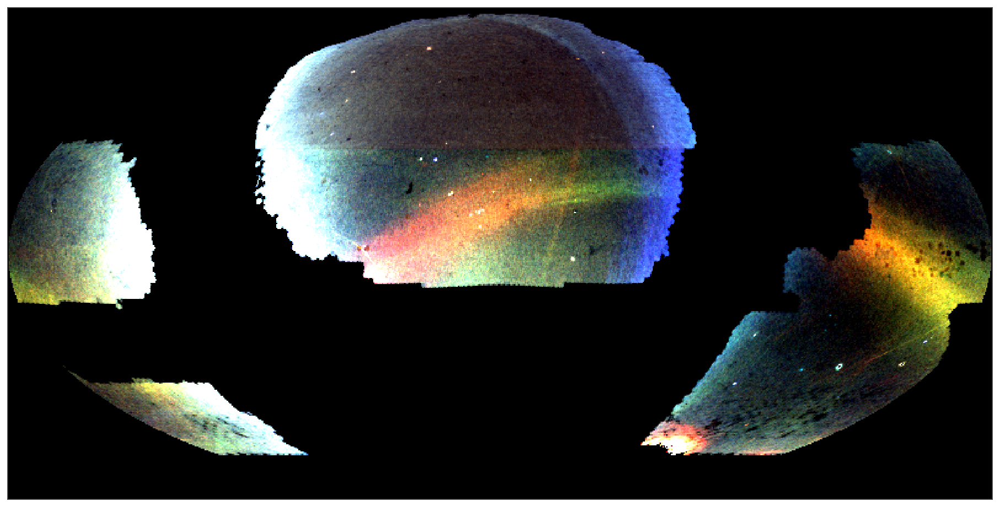

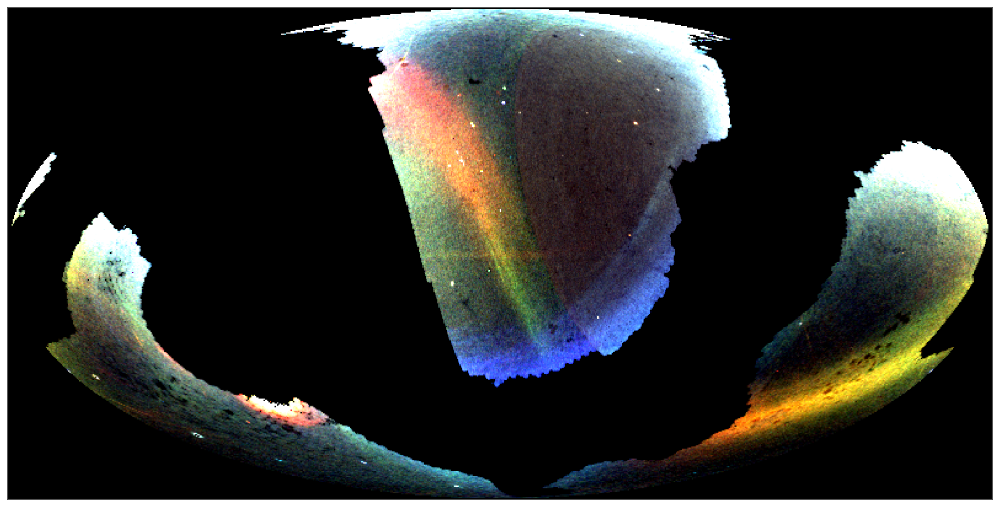

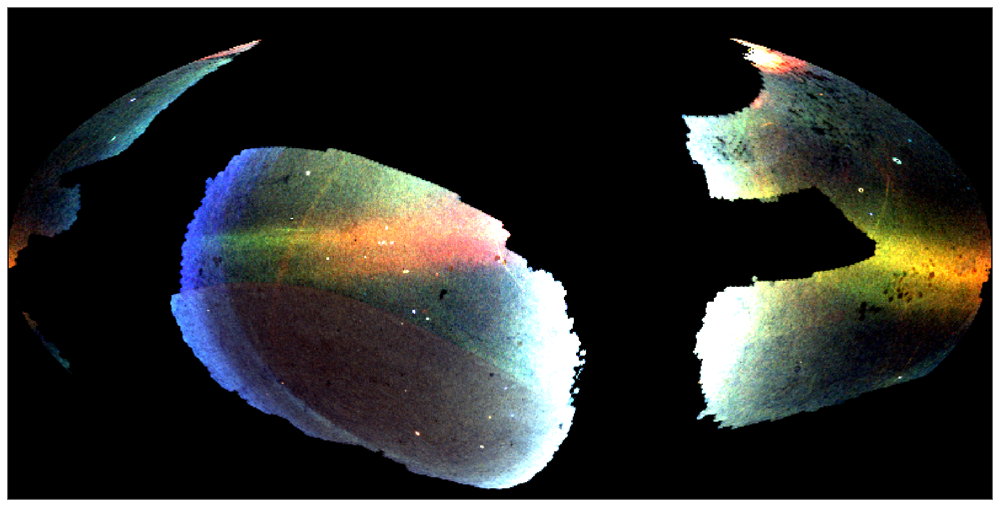

In [44]:
for name, rot in rots.items():
    proj = hp.projector.MollweideProj(rot=rot)
    img = np.stack([proj.projmap(rgb[:, i], func) 
                    for i in range(3)], axis=-1)
    fig, ax = plt.subplots(1, 1, figsize=(16, 16))
    ax.imshow(img, origin='bottom', extent=proj.get_extent())
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

## Pal 5

In [65]:
slices = [(33, 38),
          (25, 33),
          (10, 25)]

slice_str = '_'.join(['{}-{}'.format(x,y) for x,y in slices])
dist = coord.Distance(distmod=distmods)

for x, y in slices:
    print(dist[x], dist[y])

28.840315031265938 kpc 36.30780547700988 kpc
19.952623149688748 kpc 28.840315031265938 kpc
9.99999999999998 kpc 19.952623149688748 kpc


In [83]:
stacks = np.stack([np.sum(cube[:, x:y], axis=1) / (y - x) 
                   for x, y in slices], 
                  axis=-1)

rgb = np.zeros_like(stacks)
for i in range(3):
    X = stacks[..., i]

    # No bg subtrack:
    rgb[..., i] = hp.smoothing(X, sigma=np.radians(0.08), 
                               verbose=False)
#     rgb[X==0, i] = 0.

for i in range(3):
    X = stacks[..., i]
    
    rgb[..., i] = apwnorm(rgb[..., i], 
                          min=np.nanpercentile(rgb[footprint, i], 5), #2.5), 
                          max=np.nanpercentile(rgb[footprint, i], 99))
    
    rgb[X==0, i] = 0.

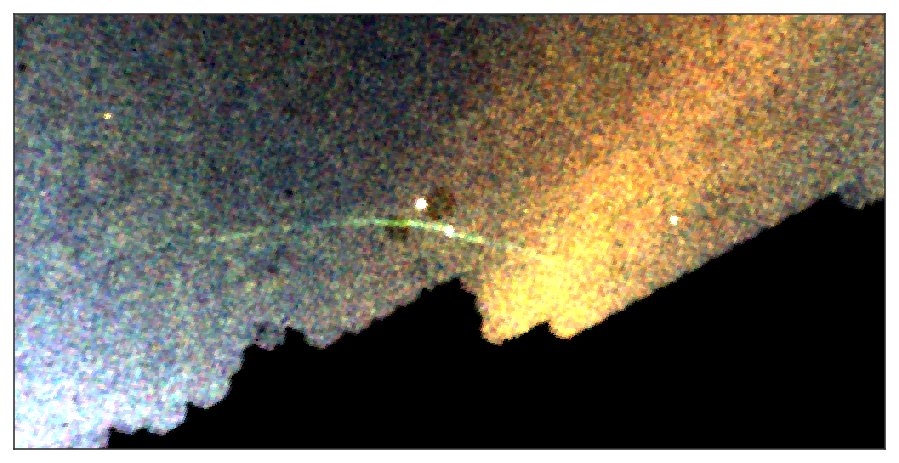

In [84]:
pal5_rot = [229.0180005224875, -0.12400080952850652, 30]
proj = hp.projector.GnomonicProj(rot=pal5_rot, reso=3,
                                 xsize=1024, ysize=512)
img = np.stack([proj.projmap(rgb[:, i], func) 
                for i in range(3)], axis=-1)

fig, ax = plt.subplots(1, 1, figsize=(8, 4))
ax.imshow(img, origin='bottom', extent=proj.get_extent())

ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

## GD-1

In [120]:
slices = [(12, 22),
          (6, 12),
          (0, 6)]

slice_str = '_'.join(['{}-{}'.format(x,y) for x,y in slices])
dist = coord.Distance(distmod=distmods)

for x, y in slices:
    print(dist[x], dist[y])

10.964781961431829 kpc 17.378008287493692 kpc
8.3176377110267 kpc 10.964781961431829 kpc
6.309573444801931 kpc 8.3176377110267 kpc


In [130]:
stacks = np.stack([np.sum(cube[:, x:y], axis=1) / (y - x) 
                   for x, y in slices], 
                  axis=-1)

rgb = np.zeros_like(stacks)
for i in range(3):
    X = stacks[..., i]

    # No bg subtrack:
    rgb[..., i] = hp.smoothing(X, sigma=np.radians(0.1), 
                               verbose=False)
#     rgb[X==0, i] = 0.

for i in range(3):
    X = stacks[..., i]
    
    rgb[..., i] = apwnorm(rgb[..., i], 
                          min=np.nanpercentile(rgb[footprint, i], 5), #2.5), 
                          max=np.nanpercentile(rgb[footprint, i], 80))
    
    rgb[X==0, i] = 0.

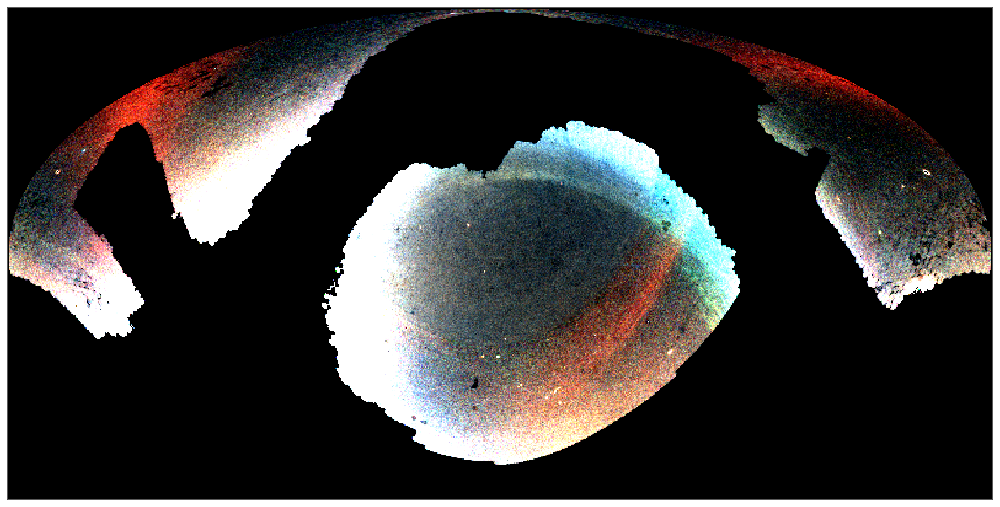

In [132]:
rot = [200.00000000142208, 59.45043410314306, 8]
proj = hp.projector.MollweideProj(rot=rot)
img = np.stack([proj.projmap(rgb[:, i], func) 
                for i in range(3)], axis=-1)
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
ax.imshow(img, origin='bottom', extent=proj.get_extent())
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

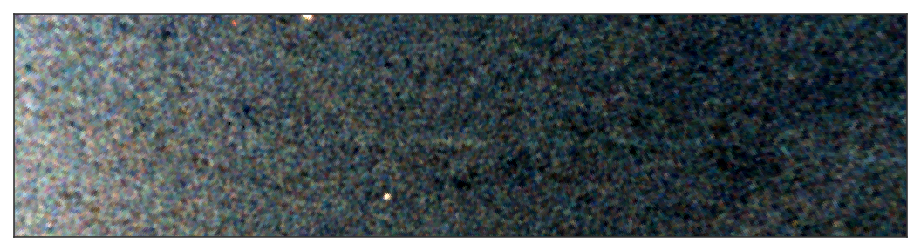

In [138]:
proj = hp.projector.GnomonicProj(rot=rot, reso=4.,
                                 xsize=1024, ysize=256)
img = np.stack([proj.projmap(rgb[:, i], func) 
                for i in range(3)], axis=-1)

fig, ax = plt.subplots(1, 1, figsize=(8, 4))
ax.imshow(img, origin='bottom', extent=proj.get_extent())

ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

## Orphan:

In [18]:
tbl = at.Table.read('/Users/apricewhelan/data/Streams/Orphan/gdr2_orphan_sergey.fits')

In [30]:
orp_c = coord.SkyCoord(tbl['ra'], tbl['dec'], unit='deg')
# orp_c = orp_c.transform_to(gc.Orphan())

In [25]:
slices = [(40, 50),
          (30, 40),
          (20, 30)]

slice_str = '_'.join(['{}-{}'.format(x,y) for x,y in slices])
dist = coord.Distance(distmod=distmods)

for x, y in slices:
    print(dist[x], dist[y])

39.81071705534945 kpc 63.09573444801878 kpc
25.118864315095667 kpc 39.81071705534945 kpc
15.848931924611078 kpc 25.118864315095667 kpc


In [26]:
stacks = np.stack([np.sum(cube[:, x:y], axis=1) / (y - x) 
                   for x, y in slices], 
                  axis=-1)

rgb = np.zeros_like(stacks)
for i in range(3):
    X = stacks[..., i]

    # No bg subtrack:
    rgb[..., i] = hp.smoothing(X, sigma=np.radians(0.2), 
                               verbose=False)
    rgb[X==0, i] = 0.

for i in range(3):
    X = stacks[..., i]
    
    rgb[..., i] = apwnorm(rgb[..., i], 
                          min=np.percentile(rgb[footprint, i], 5), #2.5), 
                          max=np.percentile(rgb[footprint, i], 90))
    
    rgb[X==0, i] = 0.

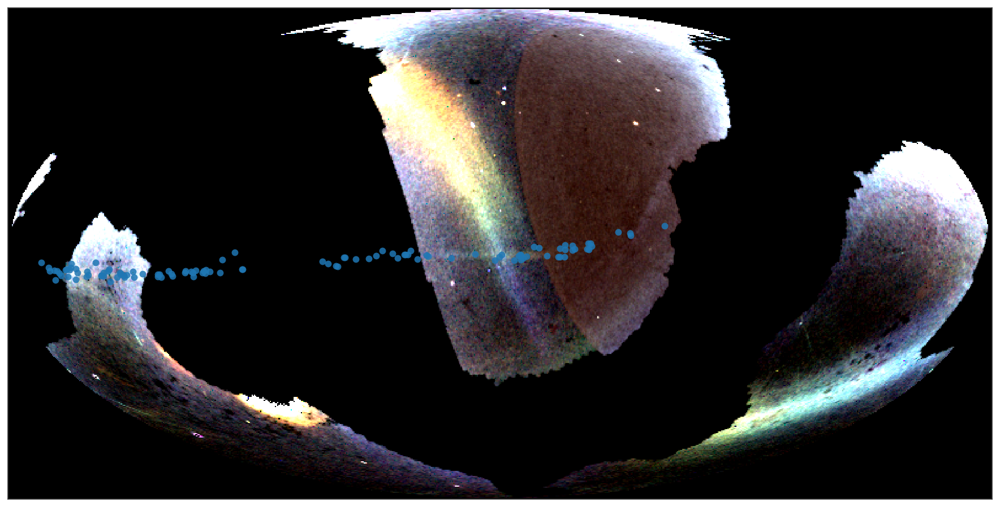

In [42]:
rot = rots['orp']
proj = hp.projector.MollweideProj(rot=rot)
img = np.stack([proj.projmap(rgb[:, i], func) 
                for i in range(3)], axis=-1)

fig, ax = plt.subplots(1, 1, figsize=(16, 8))
ax.imshow(img, origin='bottom', extent=proj.get_extent())

ax.scatter(*proj.ang2xy(orp_c.ra.degree, orp_c.dec.degree, lonlat=True),
           color='tab:blue', alpha=0.85, lw=0, s=35)

ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

In [683]:
label = True

for name, proj in projs.items():
    # if name != 'icrs': continue

    img = np.stack([proj.projmap(rgb[:, i], func) 
                    for i in range(3)], axis=-1)
    fig, ax = plt.subplots(1, 1, figsize=(16, 16))
    ax.imshow(img, origin='bottom', extent=proj.get_extent())
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

    ax.set_title('r{}  g{}  b{}'.format(*['{:.1f}–{:.1f}'.format(cube_dm[x], cube_dm[y]) 
                                          for x, y in slices]))

    fig.tight_layout()
    fig.savefig(f'../plots/fos_{name}_{slice_str}.png', dpi=300)

    if label:
        for k, (row2, c2) in enumerate(zip(all_blobs, all_blobs_c)):
            if np.sum(rgb, axis=-1)[hp.ang2pix(nside, c2.ra.degree, c2.dec.degree, lonlat=True)] == 0:
                continue
            
            if 'andromeda' in row2['name'].lower():
                continue

            xy = proj.ang2xy(c2.ra.degree, c2.dec.degree, lonlat=True)

            color = 'tab:red'
            hack_radius = row2['r_h']/600
            ax.add_patch(mpl.patches.Circle(xy, radius=hack_radius,
                                            facecolor='none', 
                                            edgecolor=color, zorder=100, 
                                            linewidth=1))
            ax.text(xy[0], xy[1] + hack_radius, row2['name'], 
                    color=color, zorder=200,
                    fontsize=10, ha='center', va='bottom')
        fig.savefig(f'../plots/fos_{name}_{slice_str}_labeled.png', dpi=300)
        
    plt.close(fig)

### Animations

In [678]:
from matplotlib.animation import FuncAnimation

MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 


Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 9.000000 arcmin (0.002618 rad) 
-> fwhm is 21.193380 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


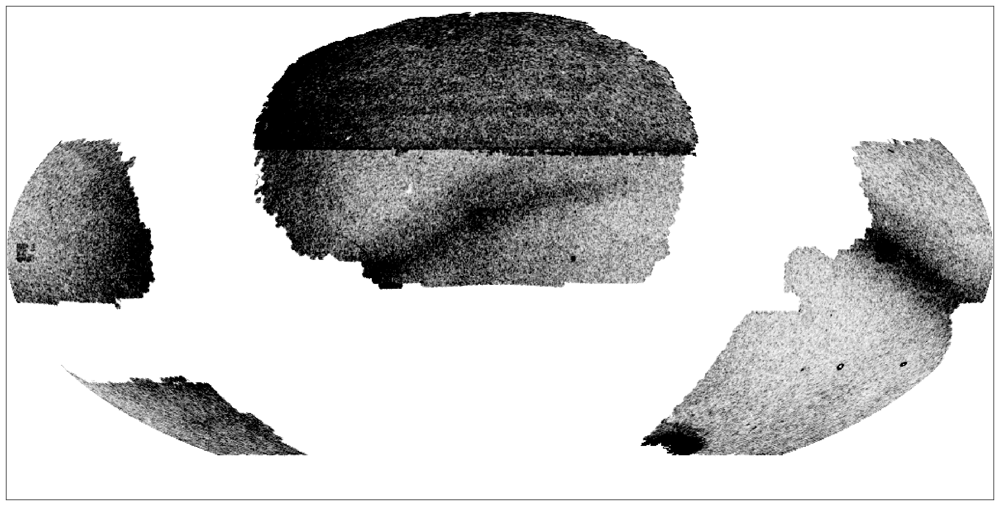

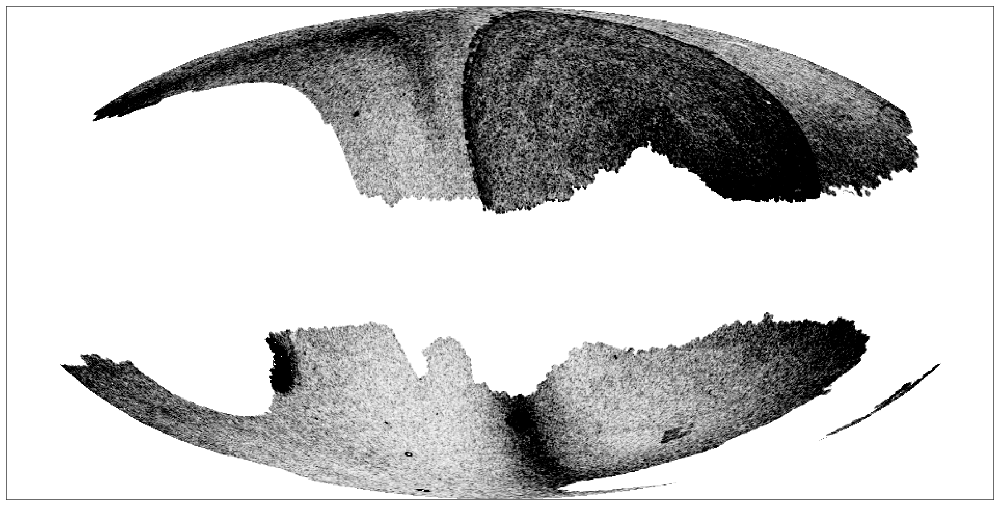

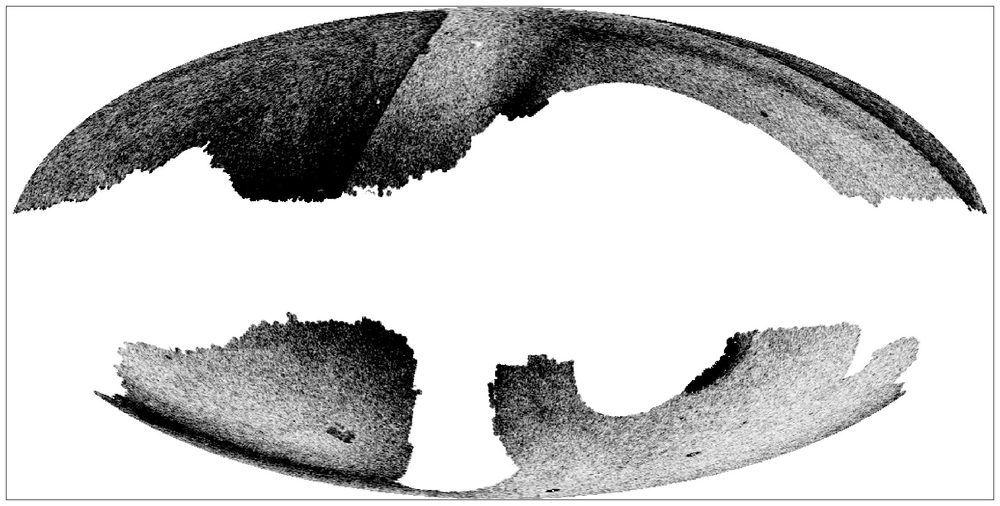

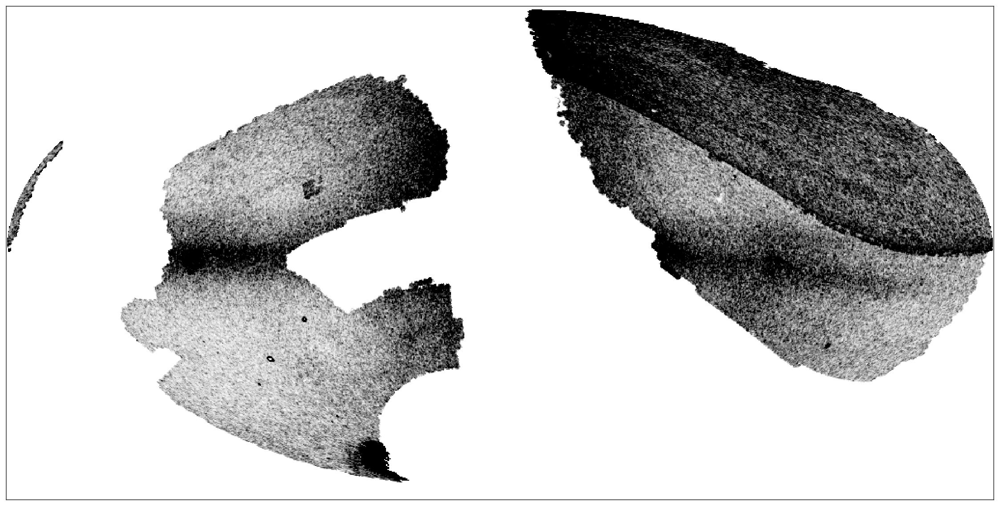

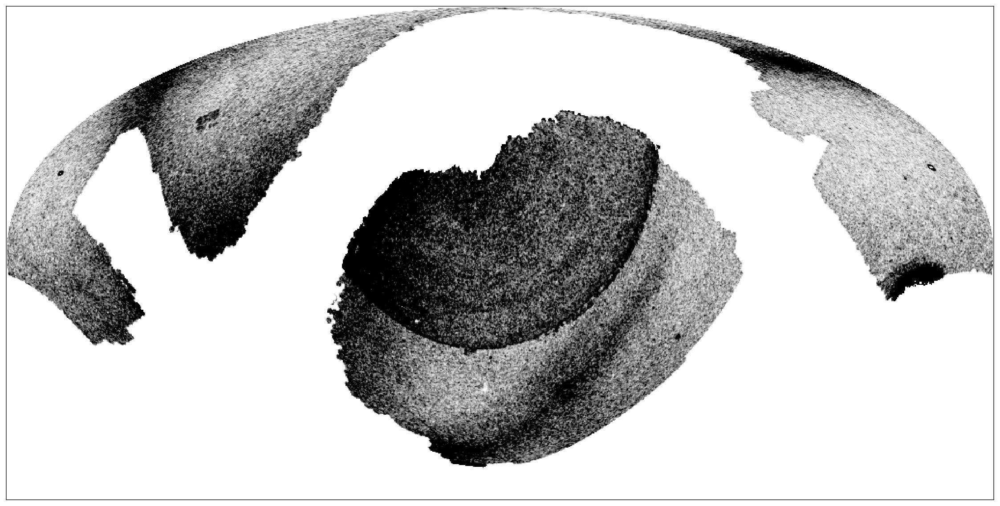

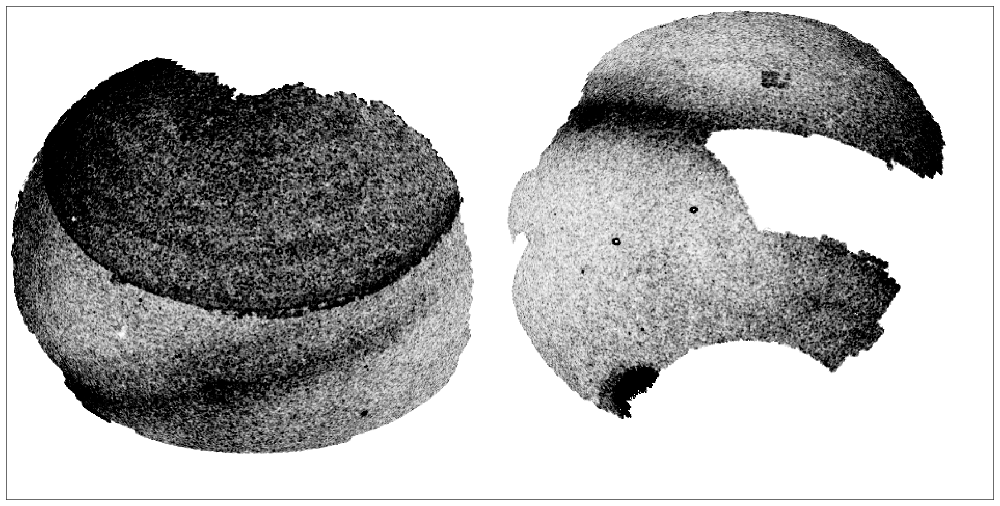

In [644]:
for name, proj in projs.items():
    # plot_path = os.path.join(f'../plots/gifs/{name}')
    # os.makedirs(plot_path, exist_ok=True)
    
    fig, ax = plt.subplots(1, 1, figsize=(16, 8))
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    fig.tight_layout()
    
    im = ax.imshow(proj.projmap(np.zeros(hp.nside2npix(nside)), func), 
                   cmap='Greys', origin='bottom', extent=proj.get_extent())
    
    def plot_slice(i):
        X = hp.smoothing(cube[:, i], sigma=np.radians(0.15))
        X = apwnorm(X) 
        X[cubesum == 0] = 0.
        
        im.set_array(proj.projmap(X, func))
        
        vmin = np.percentile(X, 1),
        vmax = np.percentile(X, 92.5)
        im.norm.vmin = vmin
        im.norm.vmax = vmax
        return im,
    
    anim = FuncAnimation(fig, plot_slice, frames=n_slice, 
                         blit=True)
    anim.save(f'../plots/{name}.gif', dpi=250)
    
    #for i in np.arange(n_slice, dtype=int):
        
        
#         fig, ax = plt.subplots(1, 1, figsize=(16, 8))
#         im = ax.imshow(proj.projmap(X, func), cmap='Greys',
#                        origin='bottom', extent=proj.get_extent())
#         ax.xaxis.set_visible(False)
#         ax.yaxis.set_visible(False)
#         fig.tight_layout()

        # fig.savefig(os.path.join(plot_path, f'{i:02d}.png'), dpi=200)
#         break
    del anim

<ICRS Coordinate: (ra, dec) in deg
    (200., 59.4504341)>


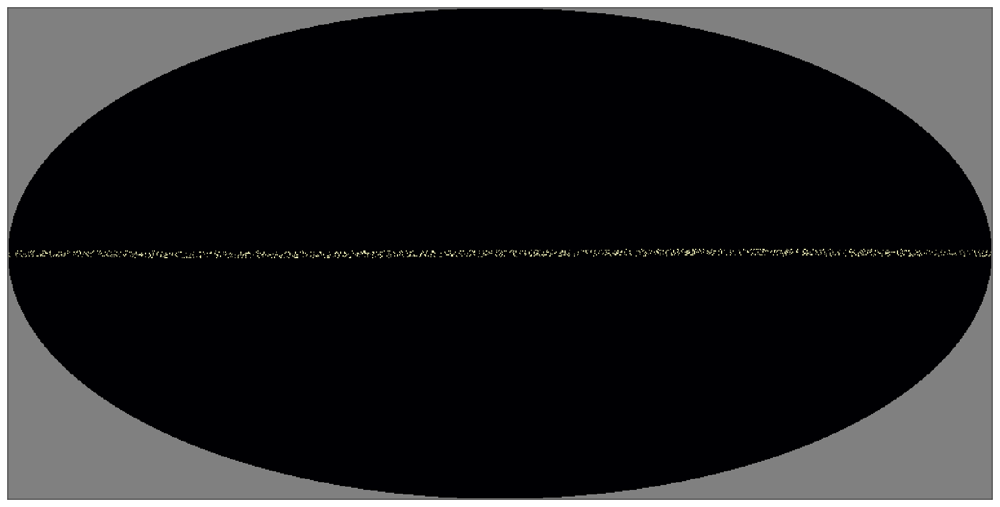

In [625]:
# print(coord.Galactic(0*u.deg, 0*u.deg).transform_to(coord.ICRS))


# gal = coord.Galactic(np.random.uniform(0, 360, 10000)*u.deg, 
#                      np.random.uniform(-1, 1, size=10000)*u.deg)
# icrs = gal.transform_to(coord.ICRS)

# hack = np.zeros_like(rgb[:, 0])
# hack[hp.ang2pix(nside, icrs.ra.degree, icrs.dec.degree, lonlat=True)] = 1.
# img = proj.projmap(hack, func) 

# Sag:
# print(gc.Sagittarius(0*u.deg, 0*u.deg).transform_to(coord.ICRS))


# gal = gc.Sagittarius(np.random.uniform(0, 360, 10000)*u.deg, 
#                      np.random.uniform(-1, 1, size=10000)*u.deg)
# icrs = gal.transform_to(coord.ICRS)

# hack = np.zeros_like(rgb[:, 0])
# hack[hp.ang2pix(nside, icrs.ra.degree, icrs.dec.degree, lonlat=True)] = 1.

# proj = hp.projector.MollweideProj(xsize=1024, 
#                                   rot=[284.03876751, -29.00408353, -10.])
# img = proj.projmap(hack, func) 

# GD-1:
# print(gc.GD1(0*u.deg, 0*u.deg).transform_to(coord.ICRS))

# gal = gc.GD1(np.random.uniform(0, 360, 10000)*u.deg, 
#                      np.random.uniform(-1, 1, size=10000)*u.deg)
# icrs = gal.transform_to(coord.ICRS)

# hack = np.zeros_like(rgb[:, 0])
# hack[hp.ang2pix(nside, icrs.ra.degree, icrs.dec.degree, lonlat=True)] = 1.

# proj = hp.projector.MollweideProj(xsize=1024, 
#                                   rot=[200., 59.4504341, 13.])
# img = proj.projmap(hack, func) 

# fig, ax = plt.subplots(1, 1, figsize=(16, 16))
# ax.imshow(img, origin='bottom', extent=proj.get_extent())
# ax.xaxis.set_visible(False)
# ax.yaxis.set_visible(False)

---

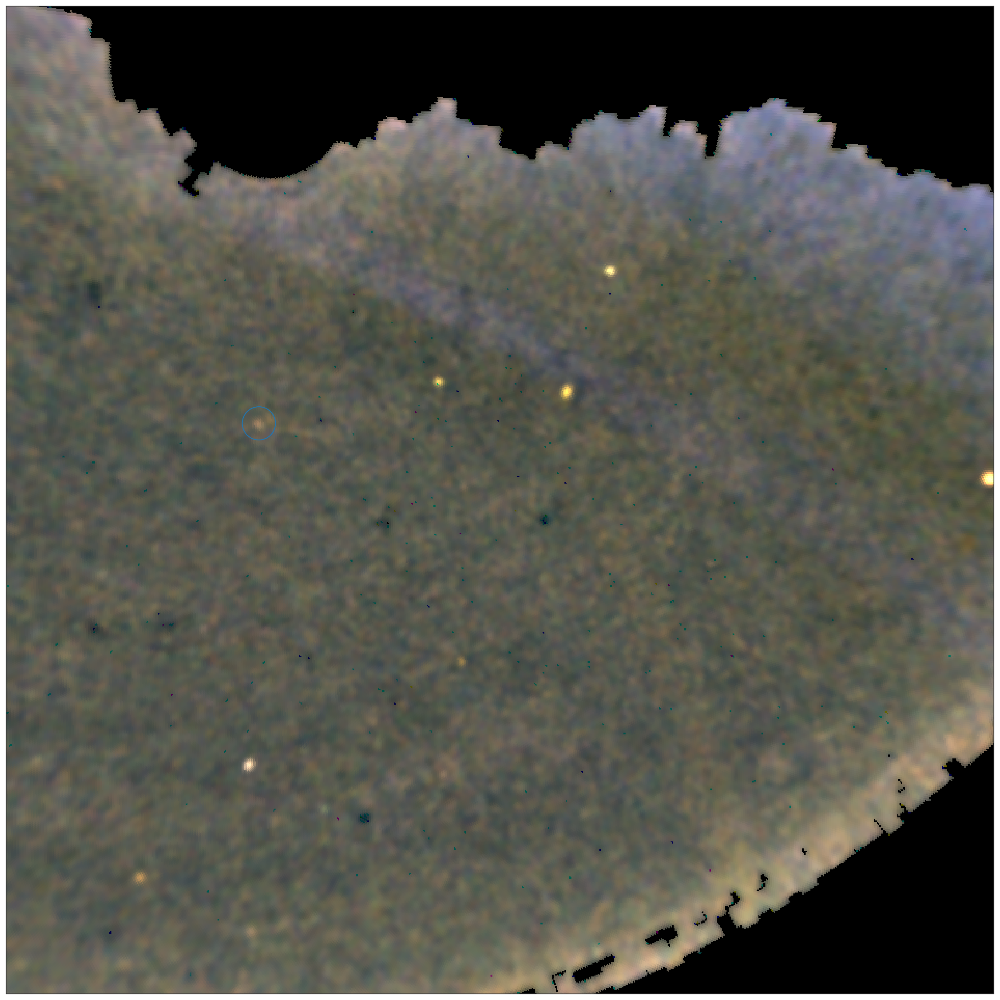

In [175]:
proj = hp.projector.GnomonicProj(xsize=1024, ysize=1024,
                                 rot=[150, 60, 30], reso=4)

img = np.stack([proj.projmap(rgb[:, i], func) 
                for i in range(3)], axis=-1)

fig, ax = plt.subplots(1, 1, figsize=(16, 16))
ax.imshow(img, origin='bottom', extent=proj.get_extent())
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

xy = proj.ang2xy(184, 69.4, lonlat=True)
ax.add_patch(mpl.patches.Circle(xy, radius=0.02,
                                facecolor='none', 
                                edgecolor='tab:blue', zorder=100, 
                                linewidth=1))

fig.tight_layout()